In [1]:
import warnings
warnings.filterwarnings('ignore')

## gene metrics

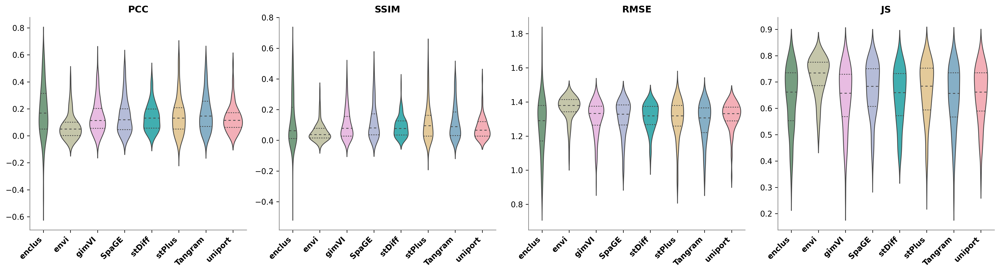

In [19]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('default')
path = 'Result/'
dataset = 'dataset11'

impute_count_dir = path + dataset
impute_count = os.listdir(impute_count_dir)
impute_count = [x for x in impute_count if x[-3:] == 'csv']
Tools = [impute_count_file.split('_')[0] for impute_count_file in impute_count]

def make_plot_one_dataset(path, Data, metric, part, ax):
    Tools_data = [None] * len(Tools)
    a = pd.DataFrame()
    
    for i in range(len(Tools)):
        File = path + Data + '/' + Tools[i] + part + '_Metrics.txt'
        if os.path.isfile(File):
            Tools_data[i] = pd.read_table(File, sep='\t', index_col=0, header=0)
            a = pd.concat([a, Tools_data[i][metric]], axis=1)
    
    a.columns = Tools
    a_melted = a.melt(var_name='Method', value_name='Value')
    
    colors = ["#70A37D", "#CACBA5", "#F0B4E7", "#AFB9DE", "#2EC0C2", "#F0CE8E", 
              "#7BB2D1", "#FEA4AF", "#cab2d6", "#6a3d9a", "#ffff99", "#b15928"]
    
    sns.violinplot(
        x='Method', y='Value', data=a_melted, palette=colors, 
        inner='quartile', showfliers=False, ax=ax, linewidth=1,width=0.8
    )
    
    ax.spines['left'].set_color('gray')
    ax.spines['bottom'].set_color('gray')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=10, fontweight='bold')
    ax.set_title(metric, fontsize=12, fontweight='bold')
    ax.set_ylabel('')
    ax.set_xlabel('')

metrics = ['PCC', 'SSIM', 'RMSE', 'JS']
parts = ['_gene']

fig, axs = plt.subplots(1, 4, figsize=(18, 5), dpi=300)

for i, metric in enumerate(metrics):
    make_plot_one_dataset(path, dataset, metric, parts[0], axs[i])

plt.tight_layout()
plt.savefig(f'./Result/violin/{dataset}_metrics_combined.pdf', bbox_inches='tight', dpi=300)
plt.show()

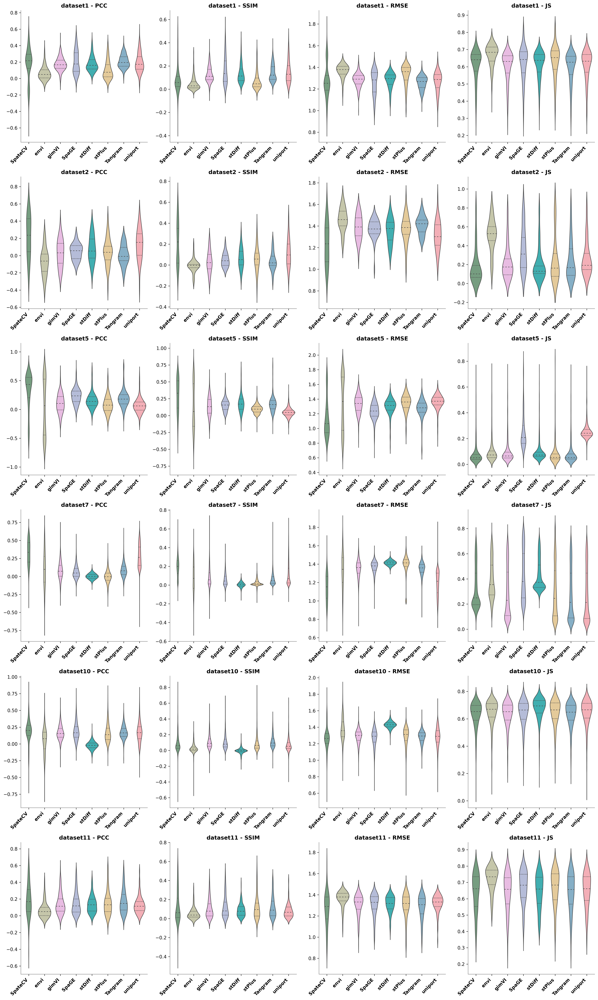

In [3]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('default')
path = 'Result/'
datasets = ['dataset1', 'dataset2', 'dataset5', 'dataset7', 'dataset10', 'dataset11']

metrics = ['PCC', 'SSIM', 'RMSE', 'JS']
parts = ['_gene']

def make_plot_one_dataset(path, Data, metric, part, ax):
    impute_count_dir = path + Data
    impute_count = os.listdir(impute_count_dir)
    impute_count = [x for x in impute_count if x.endswith('csv')]
    Tools = [impute_count_file.split('_')[0] for impute_count_file in impute_count]
    
    if 'SpateCV' in Tools:
        Tools.remove('SpateCV')
        Tools = ['SpateCV'] + Tools  
    
    Tools_data = [None] * len(Tools)
    a = pd.DataFrame()
    
    for i in range(len(Tools)):
        File = path + Data + '/' + Tools[i] + part + '_Metrics.txt'
        if os.path.isfile(File):
            Tools_data[i] = pd.read_table(File, sep='\t', index_col=0, header=0)
            a = pd.concat([a, Tools_data[i][metric]], axis=1)
    
    a.columns = Tools
    a_melted = a.melt(var_name='Method', value_name='Value')
    
    colors = ["#70A37D", "#CACBA5", "#F0B4E7", "#AFB9DE", "#2EC0C2", "#F0CE8E", 
              "#7BB2D1", "#FEA4AF", "#cab2d6", "#6a3d9a", "#ffff99", "#b15928"]
    
    sns.violinplot(
        x='Method', y='Value', data=a_melted, palette=colors, 
        inner='quartile', showfliers=False, ax=ax, linewidth=1, width=0.8,
        order=Tools  
    )
    
    ax.spines['left'].set_color('gray')
    ax.spines['bottom'].set_color('gray')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=10, fontweight='bold')
    ax.set_title(metric, fontsize=12, fontweight='bold')
    ax.set_ylabel('')
    ax.set_xlabel('')

fig, axs = plt.subplots(len(datasets), 4, figsize=(18, 5*len(datasets)), dpi=300)

for i, dataset in enumerate(datasets):
    for j, metric in enumerate(metrics):
        make_plot_one_dataset(path, dataset, metric, parts[0], axs[i, j])
        axs[i, j].set_title(f'{dataset} - {metric}', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('./Result/violin/combined_datasets_metrics.pdf', bbox_inches='tight', dpi=300)
plt.show()


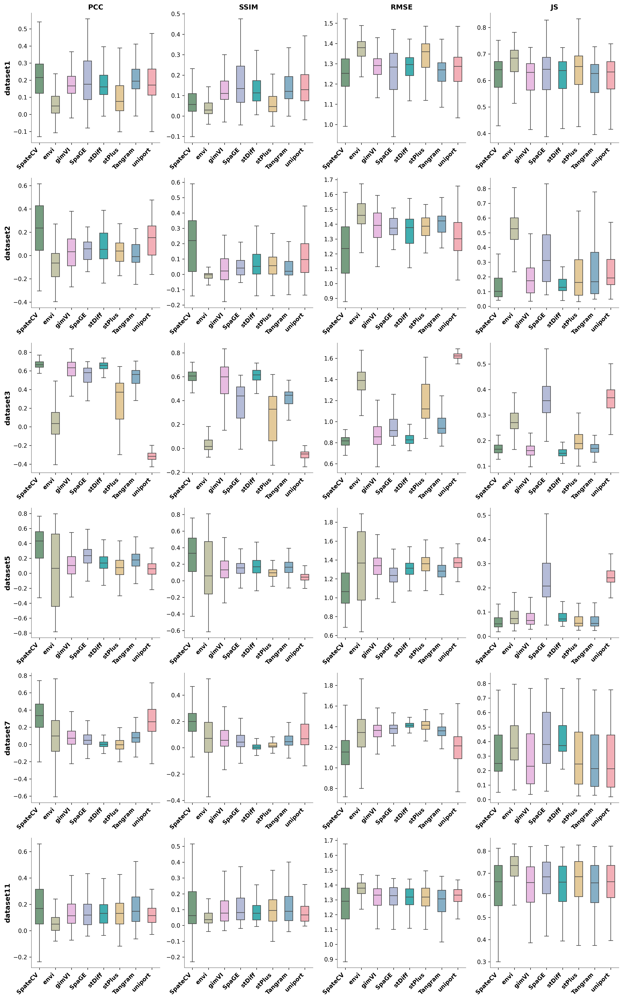

In [7]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('default')
path = 'Result/'
datasets = ['dataset1', 'dataset2','dataset3', 'dataset5', 'dataset7', 'dataset11']
# datasets = ['dataset1', 'dataset2', 'dataset5', 'dataset7']

metrics = ['PCC', 'SSIM', 'RMSE', 'JS']
parts = ['_gene']

def make_plot_one_dataset(path, Data, metric, part, ax):
    impute_count_dir = path + Data
    impute_count = os.listdir(impute_count_dir)
    impute_count = [x for x in impute_count if x.endswith('csv')]
    Tools = [impute_count_file.split('_')[0] for impute_count_file in impute_count]
    
    if 'SpateCV' in Tools:
        Tools.remove('SpateCV')
        Tools = ['SpateCV'] + Tools
    
    Tools_data = [None] * len(Tools)
    a = pd.DataFrame()
    
    for i in range(len(Tools)):
        File = path + Data + '/' + Tools[i] + part + '_Metrics.txt'
        if os.path.isfile(File):
            Tools_data[i] = pd.read_table(File, sep='\t', index_col=0, header=0)
            a = pd.concat([a, Tools_data[i][metric]], axis=1)
    
    a.columns = Tools
    a_melted = a.melt(var_name='Method', value_name='Value')
    
    colors = ["#70A37D", "#CACBA5", "#F0B4E7", "#AFB9DE", "#2EC0C2", "#F0CE8E", 
              "#7BB2D1", "#FEA4AF", "#cab2d6", "#6a3d9a", "#ffff99", "#b15928"]

    sns.boxplot(
        x='Method', y='Value', data=a_melted, palette=colors, 
        ax=ax, linewidth=1, width=0.5, showfliers=False, order=Tools
    )
    
    ax.spines['left'].set_color('gray')
    ax.spines['bottom'].set_color('gray')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=10, fontweight='bold')
    ax.set_ylabel('')
    ax.set_xlabel('')

fig, axs = plt.subplots(len(datasets), 4, figsize=(15, 4*len(datasets)), dpi=300)

for i, dataset in enumerate(datasets):
    for j, metric in enumerate(metrics):
        make_plot_one_dataset(path, dataset, metric, parts[0], axs[i, j])
        if i == 0:
            axs[i, j].set_title(f'{metric}', fontsize=12, fontweight='bold')
        else:
            axs[i, j].set_title('')

for i, dataset in enumerate(datasets):
    axs[i, 0].set_ylabel(dataset, fontsize=12, fontweight='bold')

plt.tight_layout()
# plt.savefig('./Result/violin/combined_datasets_metrics.pdf', bbox_inches='tight', dpi=300)
plt.show()


## cluster

0.4004494433931382


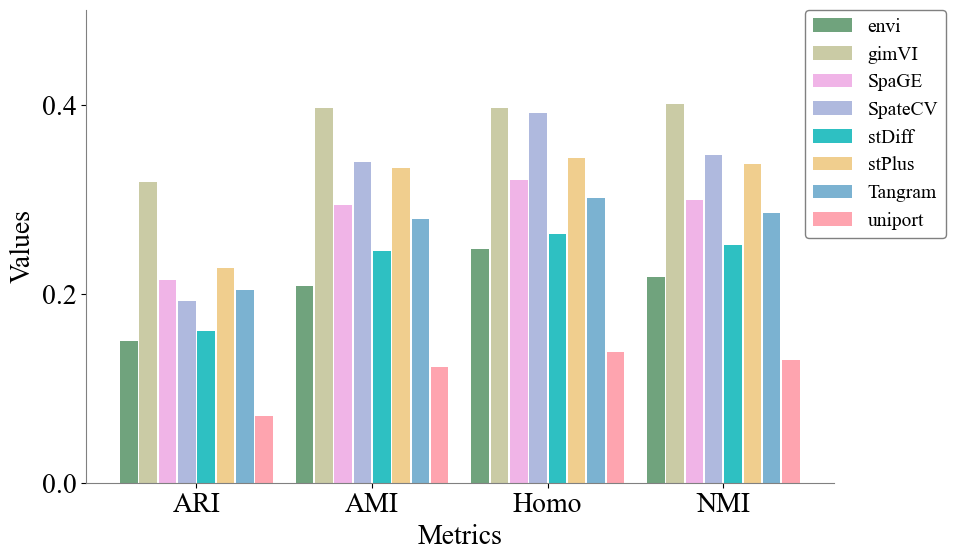

In [ ]:

plt.style.use('default')
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 20

dataset='dataset11'
file = './final/result.csv'

indicators = ['ARI', 'AMI', 'Homo', 'NMI']

df = pd.read_csv(os.path.join(path, dataset, file),index_col=0)
data = df[indicators].values.T
methods = df.index.tolist()


fig = plt.figure(figsize=(10, 6))

bar_width = 0.1
small_bar_gap = 0.01 

colors = ["#70A37D", "#CACBA5", "#F0B4E7", "#AFB9DE", "#2EC0C2", "#F0CE8E", 
          "#7BB2D1", "#FEA4AF", "#cab2d6", "#6a3d9a", "#ffff99", "#b15928"]

max_value = np.max(data)
print(max_value)
plt.yticks(np.arange(0, max_value + 0.1, 0.2), fontsize=20)

plt.ylim(0, max_value + 0.1)  


for i, method in enumerate(methods):
    bars = plt.bar(np.arange(len(indicators)) + (bar_width + small_bar_gap) * i, data[:, i], bar_width, label=method, color=colors[i])

plt.xlabel('Metrics')
plt.ylabel('Values')

center_positions = np.arange(len(indicators)) + (bar_width + small_bar_gap) * (len(methods) - 1) / 2
plt.xticks(center_positions, indicators, ha='center', fontsize=20)  # 修改此行

legend = plt.legend(
    loc='upper right',  # Change location to upper right
    fontsize=14,
    framealpha=1,
    bbox_to_anchor=(1.15, 1),  # Adjust position outside the plot
    borderaxespad=0,
    frameon=True,  # Add a frame around the legend
    edgecolor='gray'  # Add gray edge color to match the axes
)

plt.gca().spines['left'].set_color('gray')
plt.gca().spines['bottom'].set_color('gray')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()

plt.savefig(f'./Result/violin/cluster_{dataset}.pdf', bbox_inches='tight', dpi=300)
plt.show()

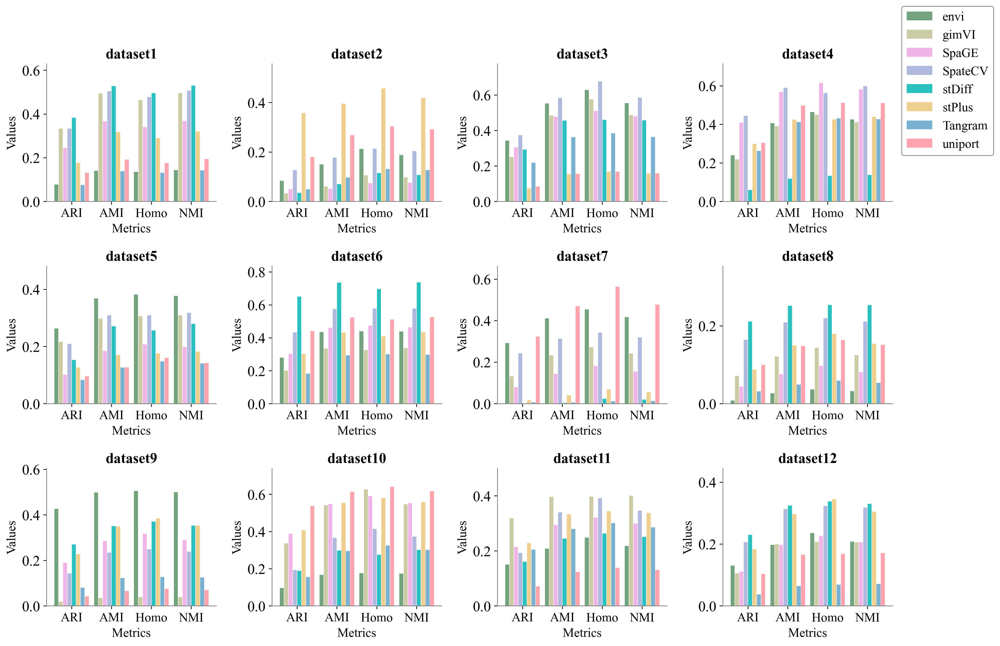

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

plt.style.use('default')
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 16

path = 'Result/'
# datasets = ['dataset3', 'dataset4', 'dataset5','dataset7', 'dataset8','dataset11']
datasets = ['dataset1', 'dataset2','dataset3', 'dataset4','dataset5', 'dataset6','dataset7', 'dataset8','dataset9','dataset10','dataset11','dataset12']

file = 'final/result.csv'
indicators = ['ARI', 'AMI', 'Homo', 'NMI']

fig, axes = plt.subplots(3, 4, figsize=(14, 10), dpi=300)

colors = ["#70A37D", "#CACBA5", "#F0B4E7", "#AFB9DE", "#2EC0C2", "#F0CE8E", 
          "#7BB2D1", "#FEA4AF", "#cab2d6", "#6a3d9a", "#ffff99", "#b15928"]

for ax, dataset in zip(axes.flat, datasets):
    df = pd.read_csv(os.path.join(path, dataset, file), index_col=0)
    data = df[indicators].values.T
    methods = df.index.tolist()

    bar_width = 0.1
    small_bar_gap = 0.01 
    large_bar_gap = 0.15 

    max_value = np.max(data)
    ax.set_yticks(np.arange(0, max_value + 0.1, 0.2))
    ax.set_ylim(0, max_value + 0.1)
    
    for i, method in enumerate(methods):
        ax.bar(np.arange(len(indicators)) + (bar_width + small_bar_gap) * i, data[:, i], bar_width, label=method, color=colors[i])
    
    ax.set_xlabel('Metrics', fontsize=14)
    ax.set_ylabel('Values', fontsize=14)
    ax.set_xticks(np.arange(len(indicators)) + (bar_width + small_bar_gap) * (len(methods) - 1) / 2)
    ax.set_xticklabels(indicators, ha='center', fontsize=14)
    ax.set_title(f'{dataset}', fontsize=16, fontweight='bold')
    
    ax.spines['left'].set_color('gray')
    ax.spines['bottom'].set_color('gray')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', fontsize=14, bbox_to_anchor=(1.1, 1),ncol=1, frameon=True, edgecolor='gray')
plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.savefig(f'./Result/violin/cluster_combined.pdf', bbox_inches='tight', dpi=300)
plt.show()

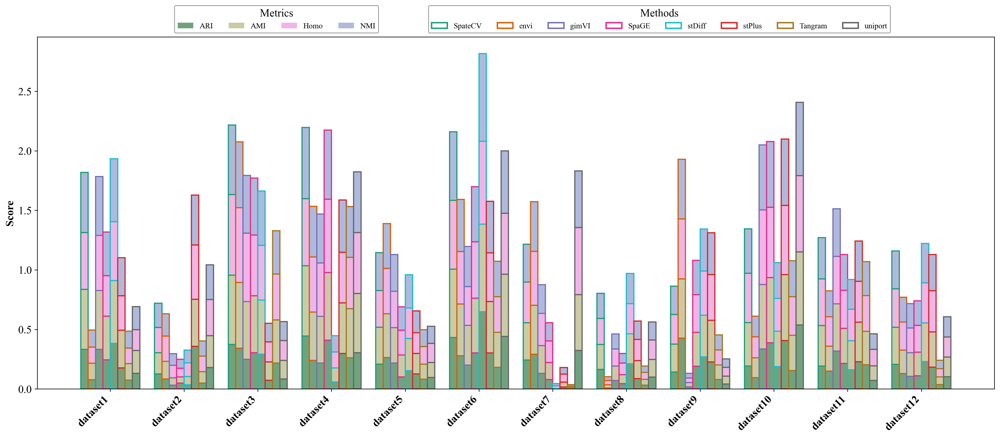

In [3]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

plt.style.use('default')
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 14

path = 'Result/'
datasets = [f'dataset{i}' for i in range(1, 13)]
file = 'final/result.csv'
indicators = ['ARI', 'AMI', 'Homo', 'NMI']
metric_colors = ["#70A37D", "#CACBA5", "#F0B4E7", "#AFB9DE"]

df0 = pd.read_csv(os.path.join(path, datasets[0], file), index_col=0)
methods = df0.index.tolist()
if 'SpateCV' in methods:
    methods.remove('SpateCV')
    methods = ['SpateCV'] + methods

all_df = {}
for ds in datasets:
    df = pd.read_csv(os.path.join(path, ds, file), index_col=0).reindex(methods)
    df['Total'] = df[indicators].sum(axis=1)
    all_df[ds] = df

n_methods = len(methods)
# cmap = plt.get_cmap('Dark2')
# method_colors = cmap(np.linspace(0, 1, n_methods))
method_colors = [
    '#1B9E77',    '#D95F02',   '#7570B3',    '#E7298A',    '#17becf',    '#d62728',   '#A6761D',    '#666666'][:n_methods]


fig, ax = plt.subplots(figsize=(18, 8), dpi=300)
x = np.arange(len(datasets))
bar_width = 0.8 / n_methods

for i, method in enumerate(methods):
    edge_col = method_colors[i]
    for j, metric in enumerate(indicators):
        heights = [all_df[ds].loc[method, metric] for ds in datasets]
        bottoms = np.sum(
            [[all_df[ds].loc[method, m] for ds in datasets] for m in indicators[:j]],
            axis=0
        )
        bars = ax.bar(
            x + i * bar_width,
            heights,
            bar_width,
            bottom=bottoms,
            color=metric_colors[j],
            edgecolor=edge_col,
            linewidth=1.5
        )

metric_patches = [
    Patch(facecolor=metric_colors[k], label=indicators[k])
    for k in range(len(indicators))
]
leg1 = ax.legend(
    handles=metric_patches,
    title='Metrics',
    ncol=4,
    loc='upper center',
    bbox_to_anchor=(0.25, 1.10),
    frameon=True,
    edgecolor='gray',
    fontsize=10
)

method_patches = [
    Patch(facecolor='white', edgecolor=method_colors[i],
          linewidth=1.8, label=methods[i])
    for i in range(n_methods)
]
leg2 = ax.legend(
    handles=method_patches,
    title='Methods',
    ncol=8,
    loc='upper center',
    bbox_to_anchor=(0.65, 1.10),
    frameon=True,
    edgecolor='gray',
    fontsize=10
)

ax.add_artist(leg1) 
ax.set_xticks(x + bar_width * (n_methods - 1) / 2)
ax.set_xticklabels(datasets, rotation=45, ha='right', fontsize=14,fontweight='bold')
ax.set_ylabel('Score', fontsize=14,fontweight='bold')

plt.tight_layout()
plt.savefig('./Result/violin/cluster_metrics.pdf', bbox_inches='tight', dpi=300)
plt.show()

## UMAP

In [4]:
import scipy.sparse as sp
import os
import matplotlib.pyplot as plt
import scanpy as sc
import anndata as ad
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
plt.style.use('default')

sc_data = "dataset5_seq_915.h5ad"
sp_data = 'dataset5_spatial_915.h5ad'
document = 'dataset5'

outdir = 'Result/' + document + '/'
save_file = outdir + 'batch/'
os.makedirs(save_file, exist_ok=True)

real_spatial = sc.read_h5ad('datasets/sp/' + sp_data)
real_seq_share = sc.read_h5ad('datasets/sc/' + sc_data)
if isinstance(real_seq_share.X, sp.csr_matrix):
    real_seq_share.X = real_seq_share.X.toarray() 

# sc.pp.normalize_total(real_seq_share, target_sum=1e4)
sc.pp.log1p(real_seq_share)

# sc.pp.normalize_total(real_spatial, target_sum=1e4)
sc.pp.log1p(real_spatial)
# sc.set_figure_params(dpi=300,dpi_save=300,facecolor='white',format='pdf')
sc._settings.ScanpyConfig.autosave = True

def plot_hvg_tsne(hvg_adata, color=['celltype'], path=None, save_filename=None):
    sc.set_figure_params(dpi=300, dpi_save=300, facecolor='white', format='pdf')
    hvg_adata = hvg_adata.copy()
    if save_filename:
        sc.settings.figdir = path
        save = f'{save_filename}.pdf'
    else:
        save = None

    sc.pp.scale(hvg_adata, max_value=20)
    sc.tl.pca(hvg_adata)
    sc.pp.neighbors(hvg_adata, n_pcs=30, n_neighbors=15)
    sc.tl.tsne(hvg_adata)
    sc.pl.tsne(hvg_adata, color=color, legend_fontsize=15, ncols=2, show=None, save=save)
    return hvg_adata

def plot_hvg_umap(hvg_adata, color=['celltype'], path=None, save_filename=None):
    sc.set_figure_params(dpi=300, dpi_save=300, facecolor='white', format='pdf')
    hvg_adata = hvg_adata.copy()
    if save_filename:
        sc.settings.figdir = path
        save = f'{save_filename}.pdf'
    else:
        save = None

    sc.pp.scale(hvg_adata, max_value=20)
    sc.tl.pca(hvg_adata)
    sc.pp.neighbors(hvg_adata, n_pcs=30, n_neighbors=15)

    sc.tl.umap(hvg_adata, min_dist=0.5, n_components=2)

    sc.pl.umap(hvg_adata, color=color, legend_fontsize=15, ncols=2, show=None, save=save)
    return hvg_adata

def cluster(file, impu_share_data):
    real_spatial_share = real_spatial.copy()

    impu_share = real_spatial.copy()
    impu_share.X = impu_share_data

    rna_share = real_seq_share.copy()

    # share batch
    real_spatial_share.obs[file] = 'ST_real'
    real_spatial_share.obs[file] = real_spatial_share.obs[file].astype('category')
    impu_share.obs[file] = 'ST_impu'
    impu_share.obs[file] = impu_share.obs[file].astype('category')
    rna_share.obs[file] = 'SC_real'
    rna_share.obs[file] = rna_share.obs[file].astype('category')

    merge_share = ad.concat([real_spatial_share, impu_share, rna_share])
    plot_hvg_tsne(merge_share, color=[file], path=save_file, save_filename=file)
    plot_hvg_umap(merge_share, color=[file], path=save_file, save_filename=file)
    return

impute_methods = os.listdir(outdir)
impute_methods = [x for x in impute_methods if x[-3:] == 'csv']
impute_data_files = [os.path.join(outdir, method) for method in impute_methods]

for method_file in impute_data_files:
    impu_share_data = pd.read_csv(method_file, header=0, index_col=0)
    method_name = method_file.split('/')[-1].split('_')[0] 
    cluster(method_name, impu_share_data=impu_share_data)

## Spatial pattern

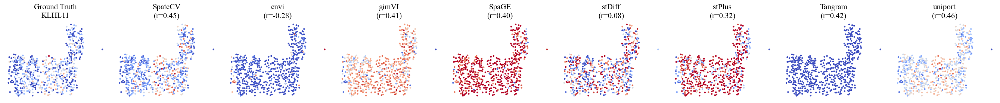

In [83]:
import os
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr

def plot_spatial_comparison(adata_spatial3, impu_array_dict, genes, dot_size, dataset_name, outdir):
    origin_array = pd.DataFrame(adata_spatial3.X, columns=adata_spatial3.var_names)
    origin_array.columns = [x.upper() for x in origin_array.columns]
    adata_spatial3.obs['x_coord'] = adata_spatial3.obsm['spatial'][:, 0]
    adata_spatial3.obs['y_coord'] = adata_spatial3.obsm['spatial'][:, 1]

    num_methods = len(impu_array_dict)
    
    fig, axes = plt.subplots(len(genes), num_methods + 1, figsize=(3 * (num_methods + 1), 3 * len(genes)))
    
    if len(genes) == 1:
        axes = np.array([axes])

    fig.patch.set_facecolor('white')  
    for row_idx, gene in enumerate(genes):
  
        ax = axes[row_idx, 0]
        ax.set_facecolor('white')
        ax.axis('off')
        cmap_values = origin_array[gene].copy()
        vmax = np.percentile(cmap_values, 100)  
        cmap_values[cmap_values > vmax] = vmax
        vmin = np.percentile(cmap_values, 0) 
        cmap_values[cmap_values < vmin] = vmin
        scatter = ax.scatter(adata_spatial3.obs['x_coord'], adata_spatial3.obs['y_coord'], 
                             s=dot_size, c=cmap_values, cmap='coolwarm')
        ax.set_title(f'Ground Truth\n{gene}', fontsize=15)

        for col_idx, (method_name, impu_array) in enumerate(impu_array_dict.items()):
            ax = axes[row_idx, col_idx + 1]
            ax.axis('off')

            impu_values = impu_array[gene].copy()
            impu_values[impu_values > vmax] = vmax

            ax.scatter(adata_spatial3.obs['x_coord'], adata_spatial3.obs['y_coord'], 
                       s=dot_size, c=impu_values, cmap='coolwarm')


            true_values = origin_array[gene].values
            predicted_values = impu_array[gene].values
            corr_coefficient, _ = pearsonr(true_values, predicted_values)

            ax.set_title(f'{method_name}\n(r={corr_coefficient:.2f})', fontsize=15)

    plt.tight_layout()
    figdir = 'Result/pattern/'
    plt.savefig(os.path.join(figdir, f'{dataset_name}_spatial_comparison.pdf'), facecolor='white')
    plt.show()
    plt.close(fig)


sp_data = 'dataset4_spatial_9684.h5ad'
dataset_name = 'dataset4'
dot_size = 5

adata_spatial3 = sc.read_h5ad('datasets/sp/' + sp_data)
sc.pp.log1p(adata_spatial3)  

outdir = 'Result/' + dataset_name + '/'
impute_methods = os.listdir(outdir)
impute_methods = [x for x in impute_methods if x[-3:] == 'csv']
impute_data_files = [os.path.join(outdir, method) for method in impute_methods]

impu_array_dict = {}
for method_file in impute_data_files:
    impu_share_data = pd.read_csv(method_file, header=0, index_col=0)
    impu_share_data.columns = [x.upper() for x in impu_share_data.columns]
    method_name = method_file.split('/')[-1].split('_')[0] 
    impu_array_dict[method_name] = impu_share_data
if 'SpateCV' in impu_array_dict:
    sp_data = impu_array_dict.pop('SpateCV')
    impu_array_dict = {'SpateCV': sp_data, **impu_array_dict}

# genes = ['Tead2']  #1
# genes = ['Mtf2'] #2
# genes = ['Relb'] #3
genes = ['KLHL11'] #4
# genes = ['CELF1']  #5
# genes = ['Cbln2'] #6
# genes = ['KLHL11'] #7
# genes = ['Slc17a7'] #8
# genes = ['Gfap']#9
# genes = ['Tsnax'] #10
# genes = ['Homer1'] #11
# genes = ['ANKRD34B'] #12
 
plot_spatial_comparison(adata_spatial3, impu_array_dict, genes, dot_size, dataset_name, outdir)

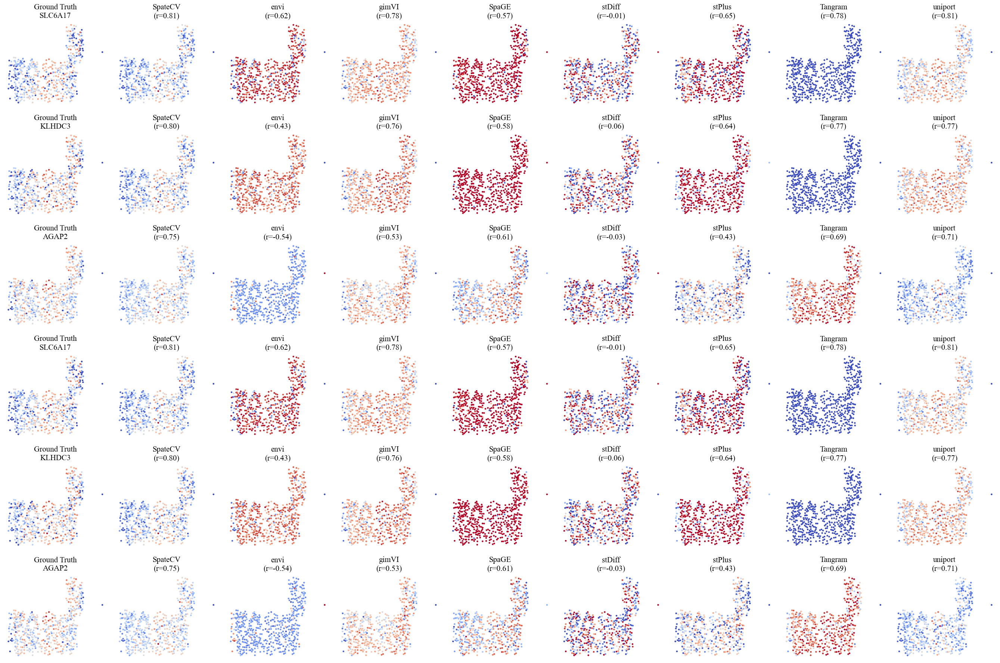

In [ ]:
def plot_spatial_comparison(adata_spatial3, impu_array_dict, genes, dot_size, dataset_name, outdir):
    origin_array = pd.DataFrame(adata_spatial3.X, columns=adata_spatial3.var_names)
    origin_array.columns = [x.upper() for x in origin_array.columns]
    adata_spatial3.obs['x_coord'] = adata_spatial3.obsm['spatial'][:, 0]
    adata_spatial3.obs['y_coord'] = adata_spatial3.obsm['spatial'][:, 1]

    num_methods = len(impu_array_dict)
    
    fig, axes = plt.subplots(len(genes), num_methods + 1, figsize=(3 * (num_methods + 1), 3 * len(genes)))
    
    if len(genes) == 1:
        axes = np.array([axes])

    fig.patch.set_facecolor('white')  
    for row_idx, gene in enumerate(genes):
       
        ax = axes[row_idx, 0]
        ax.set_facecolor('white')
        ax.axis('off')
        cmap_values = origin_array[gene].copy()
        vmax = np.percentile(cmap_values, 100)
        cmap_values[cmap_values > vmax] = vmax
        vmin = np.percentile(cmap_values, 0)  
        cmap_values[cmap_values < vmin] = vmin
        scatter = ax.scatter(adata_spatial3.obs['x_coord'], adata_spatial3.obs['y_coord'], 
                             s=dot_size, c=cmap_values, cmap='coolwarm')
        ax.set_title(f'Ground Truth\n{gene}', fontsize=15)

    
        for col_idx, (method_name, impu_array) in enumerate(impu_array_dict.items()):
            ax = axes[row_idx, col_idx + 1]
            ax.axis('off')

            impu_values = impu_array[gene].copy()
            impu_values[impu_values > vmax] = vmax

            ax.scatter(adata_spatial3.obs['x_coord'], adata_spatial3.obs['y_coord'], 
                       s=dot_size, c=impu_values, cmap='coolwarm')

            true_values = origin_array[gene].values
            predicted_values = impu_array[gene].values
            corr_coefficient, _ = pearsonr(true_values, predicted_values)

            ax.set_title(f'{method_name}\n(r={corr_coefficient:.2f})', fontsize=15)

    plt.tight_layout()
    # plt.savefig(os.path.join(outdir, f'{dataset_name}_spatial_comparison.pdf'), facecolor='white')
    plt.show()
    plt.close(fig)

sp_data = 'dataset4_spatial_9684.h5ad'
dataset_name = 'dataset4'
dot_size = 5

adata_spatial3 = sc.read_h5ad('datasets/sp/' + sp_data)
sc.pp.log1p(adata_spatial3) 

outdir = 'Result/' + dataset_name + '/'
impute_methods = os.listdir(outdir)
impute_methods = [x for x in impute_methods if x[-3:] == 'csv']
impute_data_files = [os.path.join(outdir, method) for method in impute_methods]

impu_array_dict = {}
for method_file in impute_data_files:
    impu_share_data = pd.read_csv(method_file, header=0, index_col=0)
    impu_share_data.columns = [x.upper() for x in impu_share_data.columns]
    method_name = method_file.split('/')[-1].split('_')[0]  
    impu_array_dict[method_name] = impu_share_data
if 'SpateCV' in impu_array_dict:
    sp_data = impu_array_dict.pop('SpateCV')
    impu_array_dict = {'SpateCV': sp_data, **impu_array_dict}
    
genes = ['  ', 'KLHDC3', 'AGAP2', 'SLC6A17', 'KLHDC3','AGAP2'] 
plot_spatial_comparison(adata_spatial3, impu_array_dict, genes, dot_size, dataset_name, outdir)